# Cross-Domain Neural Networks for JPEG Decompression

This Jupyter Notebook tests the U-net and W-net models for JPEG decompression.

Network 1: Image-domain U-net

Network 2: DCT-domain U-net (apply DCT on 8x8 blocks of the image)

Network 3: DCT-Image-domain W-net (use the results from Network (2) to train Network (1))

Network 4: Image-Image-domain W-net

Network 5: DCT-DCT-domain W-net (apply DCT on 8x8 blocks of the image)

In [1]:
%matplotlib inline
from __future__ import print_function, division
import matplotlib.pylab as plt
import numpy as np
from keras.optimizers import Adam
import os
import glob
import io
from PIL import Image
import sys
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.backend import eval as tf_eval
import skimage.measure as metrics

# Importing our U-Net model
MY_UTILS_PATH = "../Modules/"
if not MY_UTILS_PATH in sys.path:
    sys.path.append(MY_UTILS_PATH)
#from models import my_unet
#from cs_models import deep_cascade_unet_no_dc, deep_cascade_unet, deep_cascade_unet_ksp_no_dc,\
#dequantization_network, deep_cascade_fc_unet
from metrics import calculate_metrics
from dctools import dct_in_blocks, idct_in_blocks, py_dct2d, py_idct2d, get_quantization_matrix, \
extract_image_patches, compile_image_patches

Using TensorFlow backend.


In [10]:
from keras import backend as K
from keras.models import Model, Sequential
from keras.layers import Input, Conv2D, Lambda, Add, Subtract, LeakyReLU, \
                         MaxPooling2D, concatenate, UpSampling2D,\
                         Multiply, Dense, Flatten, Reshape


def tf_dct2d(im):
    return K.tf.transpose(K.tf.spectral.dct(K.tf.transpose(K.tf.spectral.dct(im,type=2,axis=-1,norm='ortho'),perm=[0,2,1,3]),type=2,axis=-1,norm='ortho'),perm=[0,2,1,3])
    
    
def tf_idct2d(mat): 
    return K.tf.transpose(K.tf.spectral.idct(K.tf.transpose(K.tf.spectral.idct(mat,type=2,axis=-1,norm='ortho'),perm=[0,2,1,3]),type=2,axis=-1,norm='ortho'),perm=[0,2,1,3])


# Modified from:
# https://www.programcreek.com/python/example/90422/tensorflow.extract_image_patches
def extract_patches(x):
    patches = K.tf.extract_image_patches(
        x,
        (1, 8, 8, 1),
        (1, 8, 8, 1),
        (1, 1, 1, 1),
        padding="SAME"
    )
    patches_shape = K.tf.shape(patches)
    return K.tf.reshape(patches, 
                      [K.tf.reduce_prod(patches_shape[0:3]), 
                       8, 8, 1])  # returns [batch_patches, h, w, c] 


# x = orig
# y = orig in patches
def extract_patches_inverse(x, y):
    _x = K.tf.zeros_like(x)
    _y = extract_patches(_x)
    grad = K.tf.gradients(_y, _x)[0]
    # Divide by grad, to "average" together the overlapping patches
    # otherwise they would simply sum up
    return K.tf.gradients(_y, _x, grad_ys=y)[0] / grad


def dct_layer(image):
    """
    Input: single channel array representing image domain data
    Output: single channel array representing dct coefficient data
    """
    
    patches = extract_patches(image)
    dct_patches = tf_dct2d(patches)
    #dct_image = extract_patches_inverse(image, dct_patches)
    
    return dct_patches


def idct_layer(data_list):
    """
    Input: a list of input data. See below
    Output: single channel array representing image domain data
    
    data_list: data_list[0] = dct matrix (in patches) [total_num_patches, patch_size, patch_size, chnl]
               data_list[1] = single channel image in original dimensions [batch, H, W, chnl]
    """
    
    #patches = extract_patches(dctdata)
    image_patches = tf_idct2d(data_list[0])
    image = extract_patches_inverse(data_list[1], image_patches)
    
    return image


def dct_dc_layer(data_list): #, dctmat, jpeg_dctmat, qmat):
    """
    param data_list: data_list[0] = dct matrix; 
                     data_list[1] = jpeg-compressed dct matrix; 
                     data_list[2] = quantization matrix
    
    
    param dctmat: quantization matrix for each image
    param jpeg_dctmat: single channel array representing dct coefficient data
    param qmat: quantization matrix
    Output: dct coefficients restricted to range
    """
    # Clip range: X_recon = [(X_jpeg*Q - Q/2), (X_jpeg*Q + Q/2)]        
    
#     clip_low = Subtract()([Multiply()([data_list[1], data_list[2]]), data_list[2] * 0.5])
#     clip_high = Add()([Multiply()([data_list[1], data_list[2]]), data_list[2] * 0.5])
#     return K.tf.clip_by_value(data_list[0], clip_low, clip_high)

    clip_low = Subtract()([data_list[1], data_list[2] * 0.5])
    clip_high = Add()([data_list[1], data_list[2] * 0.5])
    return K.tf.clip_by_value(data_list[0], clip_low, clip_high)

    #return K.tf.clip_by_value(dctmat, clip_low, clip_high)
    

def fft_layer(image):
    """
    Input: 2-channel array representing image domain complex data
    Output: 2-channel array representing k-space complex data
    """

    # get real and imaginary portions
    real = Lambda(lambda image: image[:, :, :, 0])(image)
    imag = Lambda(lambda image: image[:, :, :, 1])(image)

    image_complex = K.tf.complex(real, imag)  # Make complex-valued tensor
    kspace_complex = K.tf.fft2d(image_complex)

    # expand channels to tensorflow/keras format
    real = K.tf.expand_dims(K.tf.real(kspace_complex), -1)
    imag = K.tf.expand_dims(K.tf.imag(kspace_complex), -1)

    # generate 2-channel representation of k-space
    kspace = K.tf.concat([real, imag], -1)
    
    return kspace


def ifft_layer(kspace_2channel):
    """
    Input: 2-channel array representing k-space
    Output: 2-channel array representing image domain
    """
    #get real and imaginary portions
    real = Lambda(lambda kspace_2channel : kspace_2channel[:,:,:,0])(kspace_2channel)
    imag = Lambda(lambda kspace_2channel : kspace_2channel[:,:,:,1])(kspace_2channel)
    
    kspace_complex = K.tf.complex(real,imag) # Make complex-valued tensor
    image_complex = K.tf.ifft2d(kspace_complex)
    
    # expand channels to tensorflow/keras format
    real = K.tf.expand_dims(K.tf.real(image_complex),-1)
    imag = K.tf.expand_dims(K.tf.imag(image_complex),-1)
    
    # generate 2-channel representation of image domain
    image_complex_2channel = K.tf.concat([real, imag], -1)
    return image_complex_2channel


def rfft_layer(image):
    """
    Input: single-channel array representing image domain real data
    Output: 2-channel array representing k-space complex data
    """

    empty = K.tf.zeros_like(image)
    image_complex = K.tf.complex(image,empty)
    
    kspace_complex = K.tf.signal.fft2d(image_complex)
    
    real = K.tf.real(kspace_complex)
    imag = K.tf.imag(kspace_complex)

    # generate 2-channel representation of k-space
    kspace = K.tf.concat([real, imag], -1)

    return kspace


# def irfft_layer(kspace_2channel):
#     """
#     Input: 2-channel array representing k-space
#     Output: single-channel array representing real image domain
#     """
    
#     #get real and imaginary portions
#     real = Lambda(lambda kspace_2channel : kspace_2channel[:,:,:,0])(kspace_2channel)
#     imag = Lambda(lambda kspace_2channel : kspace_2channel[:,:,:,1])(kspace_2channel)
    
#     kspace_complex = K.tf.complex(real,imag) # Make complex-valued tensor
    
#     image = K.tf.signal.ifft2d(kspace_complex)
#     image = K.tf.expand_dims(image_patches,-1)
    
#     # image = extract_patches_inverse(data_list[1], image_patches)
    
#     return image_patches


def abs_layer(complex_data):
    """
    Input: 2-channel array representing complex data
    Output: 1-channel array representing magnitude of complex data
    """
    #get real and imaginary portions
    real = Lambda(lambda complex_data : complex_data[:,:,:,0])(complex_data)
    imag = Lambda(lambda complex_data : complex_data[:,:,:,1])(complex_data)
    
    mag = K.tf.abs(K.tf.complex(real,imag))
    mag = K.tf.expand_dims(mag, -1)
    return mag


def fc_dct_layer(image):
    """
    Input: single channel array representing image domain data
    Output: single channel array representing dct coefficient data (in patches)
    """
    
    patches = extract_patches(image)
    dct_patches = tf_dct2d(patches)
    
    return dct_patches


def fc_idct_layer(data_list):
    """
    Input: single channel array representing dct coefficient data (in patches)
    Output: single channel array representing image domain data
    
    data_list: data_list[0] = dct matrix (in patches) [total_num_patches, patch_size, patch_size, chnl]
               data_list[1] = single channel image in original dimensions [batch, H, W, chnl]
    """
    
    image_patches = tf_idct2d(data_list[0])
    image = extract_patches_inverse(data_list[1], image_patches)
    
    return image

def dense_block(dense_input):
    
    inputs_flat = Flatten()(dense_input)
    
    dense1 = Dense(64, input_shape=(64,), activation='tanh')(inputs_flat)
    dense2 = Dense(64, activation='tanh')(dense1)
    dense3 = Dense(128, activation='tanh')(dense2)
    dense4 = Dense(128, activation='tanh')(dense3)
    dense5 = Dense(256, activation='tanh')(dense4)
    dense6 = Dense(256, activation='tanh')(dense5)
    dense7 = Dense(128, activation='tanh')(dense6)
    dense8 = Dense(128, activation='tanh')(dense7)
    dense9 = Dense(64, activation='tanh')(dense8)
    last_dense = Dense(64, activation='tanh')(dense9)

    #output_layer = Reshape(8,8)(dense4)
    output_layer = Reshape((8,8,1), input_shape=(64,))(last_dense)
    
    return output_layer


def unet_block(unet_input, kshape=(3, 3)):
    """
    :param unet_input: Input layer
    :param kshape: Kernel size
    :return: single channel
    """

    conv1 = Conv2D(48, kshape, activation='relu', padding='same')(unet_input)
    conv1 = Conv2D(48, kshape, activation='relu', padding='same')(conv1)
    conv1 = Conv2D(48, kshape, activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(64, kshape, activation='relu', padding='same')(pool1)
    conv2 = Conv2D(64, kshape, activation='relu', padding='same')(conv2)
    conv2 = Conv2D(64, kshape, activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(128, kshape, activation='relu', padding='same')(pool2)
    conv3 = Conv2D(128, kshape, activation='relu', padding='same')(conv3)
    conv3 = Conv2D(128, kshape, activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(256, kshape, activation='relu', padding='same')(pool3)
    conv4 = Conv2D(256, kshape, activation='relu', padding='same')(conv4)
    conv4 = Conv2D(256, kshape, activation='relu', padding='same')(conv4)

    up1 = concatenate([UpSampling2D(size=(2, 2))(conv4), conv3], axis=-1)
    conv5 = Conv2D(128, kshape, activation='relu', padding='same')(up1)
    conv5 = Conv2D(128, kshape, activation='relu', padding='same')(conv5)
    conv5 = Conv2D(128, kshape, activation='relu', padding='same')(conv5)

    up2 = concatenate([UpSampling2D(size=(2, 2))(conv5), conv2], axis=-1)
    conv6 = Conv2D(64, kshape, activation='relu', padding='same')(up2)
    conv6 = Conv2D(64, kshape, activation='relu', padding='same')(conv6)
    conv6 = Conv2D(64, kshape, activation='relu', padding='same')(conv6)

    up3 = concatenate([UpSampling2D(size=(2, 2))(conv6), conv1], axis=-1)
    conv7 = Conv2D(48, kshape, activation='relu', padding='same')(up3)
    conv7 = Conv2D(48, kshape, activation='relu', padding='same')(conv7)
    conv7 = Conv2D(48, kshape, activation='relu', padding='same')(conv7)

    conv8 = Conv2D(1, (1, 1), activation='linear')(conv7)
    out = Add()([conv8, unet_input])
    return out


def unet_block_2chnl(unet_input, kshape=(3, 3)):
    """
    :param unet_input: Input layer
    :param kshape: Kernel size
    :return: 2-channel, complex reconstruction
    """

    conv1 = Conv2D(48, kshape, activation='relu', padding='same')(unet_input)
    conv1 = Conv2D(48, kshape, activation='relu', padding='same')(conv1)
    conv1 = Conv2D(48, kshape, activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(64, kshape, activation='relu', padding='same')(pool1)
    conv2 = Conv2D(64, kshape, activation='relu', padding='same')(conv2)
    conv2 = Conv2D(64, kshape, activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(128, kshape, activation='relu', padding='same')(pool2)
    conv3 = Conv2D(128, kshape, activation='relu', padding='same')(conv3)
    conv3 = Conv2D(128, kshape, activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(256, kshape, activation='relu', padding='same')(pool3)
    conv4 = Conv2D(256, kshape, activation='relu', padding='same')(conv4)
    conv4 = Conv2D(256, kshape, activation='relu', padding='same')(conv4)

    up1 = concatenate([UpSampling2D(size=(2, 2))(conv4), conv3], axis=-1)
    conv5 = Conv2D(128, kshape, activation='relu', padding='same')(up1)
    conv5 = Conv2D(128, kshape, activation='relu', padding='same')(conv5)
    conv5 = Conv2D(128, kshape, activation='relu', padding='same')(conv5)

    up2 = concatenate([UpSampling2D(size=(2, 2))(conv5), conv2], axis=-1)
    conv6 = Conv2D(64, kshape, activation='relu', padding='same')(up2)
    conv6 = Conv2D(64, kshape, activation='relu', padding='same')(conv6)
    conv6 = Conv2D(64, kshape, activation='relu', padding='same')(conv6)

    up3 = concatenate([UpSampling2D(size=(2, 2))(conv6), conv1], axis=-1)
    conv7 = Conv2D(48, kshape, activation='relu', padding='same')(up3)
    conv7 = Conv2D(48, kshape, activation='relu', padding='same')(conv7)
    conv7 = Conv2D(48, kshape, activation='relu', padding='same')(conv7)

    conv8 = Conv2D(2, (1, 1), activation='linear')(conv7)
    out = Add()([conv8, unet_input])
    return out


# NEED TO FIX:
# Don't append iDCT layer for cases like 'ff'
def deep_cascade_fc_unet(depth_str='fi', H=256, W=256, kshape=(3, 3)):
    """
    :param depth_str: string that determines the depth of the cascade and the domain of each
    subnetwork
    :param H: Image height
    :param W: Image width
    :param kshape: Kernel size
    :param nf: number of filters in each convolutional layer
    :return: Deep Cascade Flat Unrolled model
    """

    channels = 1  # inputs are represented as single channel images (grayscale)
    inputs = Input(shape=(H, W, channels))
    qmat = Input(shape=(H, W, channels))
    qmat = Lambda(extract_patches)(qmat)
    inputs_pat = Lambda(extract_patches)(inputs)
    layers = [inputs]
    fc_flag = False # flag whether input is in the image domain (false) or dct domain (true)
                    # i.e. input is in image domain
    
    for (jj,ii) in enumerate(depth_str):
        print(jj,ii)
        if ii == 'f':
            if not fc_flag: # image domain
                layers.append(Lambda(fc_dct_layer)(layers[-1]))
                print("Append DCT layer (patches)")
                layers.append(dense_block(layers[-1]))
                print("Append FC/dense block")
                layers.append(Lambda(dct_dc_layer)([layers[-1], inputs_pat, qmat]))
                print("Append data consistency block")
                fc_flag = True
            else: # DCT domain
                layers.append(dense_block(layers[-1]))
                print("Append FC/dense block")
        elif ii == 'i':
            if not fc_flag: # image domain
                layers.append(unet_block(layers[-1], kshape))
                print("Append U-net block")
                fc_flag = False
            else: # DCT domain
                layers.append(Lambda(fc_idct_layer)([layers[-1], inputs])) 
                print("Append iDCT layer (patches)")
                layers.append(unet_block(layers[-1], kshape))
                print("Append U-net block")
                fc_flag = False
        else:
            print("Layer not recognized. Only 'f' and 'i' layers are currently supported.")
            break;
            
        if not ((jj + 1) % len(depth_str) > 0) and ii == 'f' and fc_flag:
            layers.append(Lambda(fc_idct_layer)([layers[-1], inputs])) 
            print("Append iDCT layer (patches)")

    model = Model(inputs=[inputs,qmat], outputs=layers[-1])
    return model


def deep_cascade_fc_unet_no_dc(depth_str='fi', H=256, W=256, kshape=(3, 3)):
    """
    :param depth_str: string that determines the depth of the cascade and the domain of each
    subnetwork
    :param H: Image height
    :param W: Image width
    :param kshape: Kernel size
    :param nf: number of filters in each convolutional layer
    :return: Deep Cascade Flat Unrolled model
    """

    channels = 1  # inputs are represented as single channel images (grayscale)
    inputs = Input(shape=(H, W, channels))
    layers = [inputs]
    fc_flag = False # flag whether input is in the image domain (false) or dct domain (true)
                    # i.e. input is in image domain
    
    for (jj,ii) in enumerate(depth_str):
        print(jj,ii)
        if ii == 'f':
            if not fc_flag: # image domain
                layers.append(Lambda(fc_dct_layer)(layers[-1]))
                print("Append DCT layer (patches)")
                layers.append(dense_block(layers[-1]))
                print("Append FC/dense block")
                fc_flag = True
            else: # DCT domain
                layers.append(dense_block(layers[-1]))
                print("Append FC/dense block")
        elif ii == 'i':
            if not fc_flag: # image domain
                layers.append(unet_block(layers[-1], kshape))
                print("Append U-net block")
                fc_flag = False
            else: # DCT domain
                layers.append(Lambda(fc_idct_layer)([layers[-1], inputs])) 
                print("Append iDCT layer (patches)")
                layers.append(unet_block(layers[-1], kshape))
                print("Append U-net block")
                fc_flag = False
        else:
            print("Layer not recognized. Only 'f' and 'i' layers are currently supported.")
            break;
            
        if not ((jj + 1) % len(depth_str) > 0) and ii == 'f' and fc_flag:
            layers.append(Lambda(fc_idct_layer)([layers[-1], inputs])) 
            print("Append iDCT layer (patches)")

    model = Model(inputs=inputs, outputs=layers[-1])
    return model


def deep_cascade_unet_ksp_no_dc(depth_str='ki', H=256, W=256, kshape=(3, 3)):
    """
    :param depth_str: string that determines the depth of the cascade and the domain of each
    subnetwork
    :param H: Image height
    :param W: Image width
    :param kshape: Kernel size
    :param nf: number of filters in each convolutional layer
    :return: Deep Cascade Flat Unrolled model ######
    """

    channels = 2  # inputs are represented as two-channel images (complex)
    inputs = Input(shape=(H, W, channels))
    layers = [inputs]
    kspace_flag = False # flag whether input is in the image domain (false) or frequency domain (true)

    for (jj,ii) in enumerate(depth_str):
        print(jj, ii)
        if ii == 'k' and not kspace_flag:
            # Add a frequency U-net; Input should be in image domain
            layers.append(Lambda(fft_layer)(layers[-1])) 
            print("Append FFT layer")
            kspace_flag = True
        elif ii != 'k' and ii != 'i':
            print("Layer not recognized. Only 'k' and 'i' layers are currently supported.")
            break;

        # Add CNN block
        layers.append(unet_block_2chnl(layers[-1], kshape))
        print("Append U-net block")

        if kspace_flag:
            if (jj + 1) % len(depth_str) > 0: # check if there is a next element
                if depth_str[jj + 1] == 'k':
                    print("FFT layer again. Don't append iFFT layer.")
                else:
                    layers.append(Lambda(ifft_layer)(layers[-1]))
                    layers.append(Lambda(abs_layer)(layers[-1]))
                    print("Append iFFT layer")
                    print("Append magnitude layer")
                    layers.append(Lambda(concat_empty_channel)(layers[-1]))
                    kspace_flag = False
            else:
                layers.append(Lambda(ifft_layer)(layers[-1]))
                layers.append(Lambda(abs_layer)(layers[-1]))
                print("Append iFFT layer")
                print("Append magnitude layer")
                layers.append(Lambda(concat_empty_channel)(layers[-1]))
                kspace_flag = False

    model = Model(inputs=inputs, outputs=layers[-1])
    return model


def deep_cascade_unet_rksp_no_dc(depth_str='ki', H=256, W=256, kshape=(3, 3)):
    """
    :param depth_str: string that determines the depth of the cascade and the domain of each
    subnetwork
    :param H: Image height
    :param W: Image width
    :param kshape: Kernel size
    :param nf: number of filters in each convolutional layer
    :return: Deep Cascade Flat Unrolled model ######
    """

    channels = 1  # Real input image
    inputs = Input(shape=(H, W, channels))
    qmat = Input(shape=(H, W, channels))
    layers = [inputs]
    kspace_flag = False # flag whether input is in the image domain (false) or frequency domain (true)

    for (jj,ii) in enumerate(depth_str):
        print(jj, ii)
        if ii == 'k' and not kspace_flag:
            # Add a frequency U-net; Input should be in image domain
            layers.append(Lambda(rfft_layer)(layers[-1]))
            print("Append rFFT layer")
            kspace_flag = True
        elif ii != 'k' and ii != 'i':
            print("Layer not recognized. Only 'k' and 'i' layers are currently supported.")
            break;

        # Add CNN block
        layers.append(unet_block(layers[-1], kshape))
        print("Append U-net (single-channel) block")

        if kspace_flag:
            if (jj + 1) % len(depth_str) > 0: # check if there is a next element
                if depth_str[jj + 1] == 'k':
                    print("FFT layer again. Don't append iFFT layer.")
                else:
                    layers.append(Lambda(irfft_layer)(layers[-1], inputs))
                    #layers.append(Lambda(abs_layer)(layers[-1]))
                    print("Append irFFT layer")
                    #print("Append magnitude layer")
                    #layers.append(Lambda(concat_empty_channel)(layers[-1]))
                    kspace_flag = False
            else:
                layers.append(Lambda(irfft_layer)(layers[-1], inputs))
                #layers.append(Lambda(abs_layer)(layers[-1]))
                print("Append irFFT layer")
                #print("Append magnitude layer")
                #layers.append(Lambda(concat_empty_channel)(layers[-1]))
                kspace_flag = False

    model = Model(inputs=inputs, outputs=layers[-1])
    return model


def deep_cascade_unet_rksp(depth_str='ki', H=256, W=256, kshape=(3, 3)):
    """
    :param depth_str: string that determines the depth of the cascade and the domain of each
    subnetwork
    :param H: Image height
    :param W: Image width
    :param kshape: Kernel size
    :param nf: number of filters in each convolutional layer
    :return: Deep Cascade Flat Unrolled model ######
    """

    channels = 1  # Real input image
    inputs = Input(shape=(H, W, channels))
    qmat = Input(shape=(H, W, channels))
        
    inputs_patches = Lambda(extract_patches)(inputs)
    qmat_patches = Lambda(extract_patches)(qmat)
    
    layers = [inputs]
    kspace_flag = False # flag whether input is in the image domain (false) or frequency domain (true)

    for (jj,ii) in enumerate(depth_str):
        print(jj, ii)
        if ii == 'k' and not kspace_flag:
            # Add a frequency U-net; Input should be in image domain
            layers.append(Lambda(rfft_layer)(layers[-1]))
            print("Append rFFT layer")
            kspace_flag = True
            # Add CNN block
            layers.append(unet_block_2chnl(layers[-1], kshape))
            print("Append U-net (2-channel) block")
        elif ii == 'i' and not kspace_flag:
            # Add CNN block
            layers.append(unet_block(layers[-1], kshape))
            print("Append U-net (single-channel) block")
        elif ii != 'k' and ii != 'i':
            print("Layer not recognized. Only 'k' and 'i' layers are currently supported.")
            break;
            

        if kspace_flag:
            layers.append(Lambda(ifft_layer)(layers[-1]))
            print("Append iFFT layer")
            layers.append(Lambda(abs_layer)(layers[-1]))
            print("Append magnitude layer")
            kspace_flag = False
            
        print("Append data consistency layer (DCT-DC-iDCT)")
        layers.append(Lambda(dct_layer)(layers[-1])) 
        layers.append(Lambda(dct_dc_layer)([layers[-1], inputs_patches, qmat_patches]))
        layers.append(Lambda(idct_layer)([layers[-1], inputs]))

    model = Model(inputs=[inputs,qmat], outputs=layers[-1])
    return model

# Load images from file

We want to test the same set of images for each model - don't reload images after the first time

In [3]:
# Train and validation data paths
images_path = "../../Gray/*.tif"
images = glob.glob(images_path)
print(len(images))
# Listing train and validation images
train_images = images[0:30000]
val_images = images[30000:45000]
test_images = images[45000:]

# train_images = images[0:15000]
# val_images = images[30000:37500]
# test_images = images[45000:]

# Summary of images
print("Train set size:", len(train_images))
print("Validation set size:",len(val_images))
print("Test set size:",len(test_images))

48624
Train set size: 30000
Validation set size: 15000
Test set size: 3624


In [14]:
H,W = 256, 256
norm = 128.0
compr_range = (10,20)

test_unc = np.zeros((len(test_images),H,W,1), dtype=np.float32)
test_compr = test_unc.copy()
test_qmat = test_unc.copy()

compr_test = np.random.choice(np.arange(compr_range[0],compr_range[1], dtype=int), \
                               len(test_images),replace = True)

# Test set
for ii in range(len(test_images)):
    # Load uncompressed image
    im1 = Image.open(test_images[ii])
    test_unc[ii,:,:,0] = np.array(im1, np.float32)

    # JPEG compress the image    
    buf = io.BytesIO()
    im1.save(buf, "JPEG", quality=int(compr_test[ii]))
    im2 = Image.open(buf)
    test_compr[ii,:,:,0] = np.array(im2, np.float32)
    test_qmat[ii,:,:,0] = get_quantization_matrix(im2, block_size = (8,8), im_size = (256, 256))

norm_test_compr = test_compr - norm
# norm_test_compr = norm_test_compr / norm

#test_qmat /= 255.0

In [5]:
# Generate indexes to print the same images for each model
slc = 65

indexes_test = np.arange(len(test_images),dtype = int)
np.random.shuffle(indexes_test)
indexes_test = indexes_test[:3]

In [6]:
metr = calculate_metrics(test_unc, test_compr)

(3624, 3, 2)


/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/skimage/util/arraycrop.py:177: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  cropped = ar[slices]
/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/skimage/measure/_structural_similarity.py:206: RuntimeWarning: invalid value encountered in true_divide
  S = (A1 * A2) / D


removing 85 SSIM from list.
removing 1727 SSIM from list.
(3622, 3, 2)

Performance Metrics
SSIM: 0.807 +/- 0.088
PSNR: 28.063 +/- 3.721
NRMSE: 4.336 +/- 1.848


# Network H: Cascades of FC and U-nets

In [8]:
opt=Adam(lr=0.001)
model_name = "../Models/20190610-imagenet-fc_unet_cascade_fi_tf_data_augmentation_compress_10_20.hdf5"
model = deep_cascade_fc_unet_no_dc(depth_str='fi')
model.compile(loss = "mse",optimizer=opt)

model.load_weights(model_name)

0 f
Append DCT layer (patches)
Append FC/dense block
1 i
Append iDCT layer (patches)
Append U-net block


In [23]:
for layer in model.layers:
    print(layer.name)

input_4
lambda_8
flatten_3
dense_17
dense_18
dense_19
dense_20
dense_21
dense_22
dense_23
dense_24
dense_25
dense_26
reshape_3
lambda_9
conv2d_45
conv2d_46
conv2d_47
max_pooling2d_7
conv2d_48
conv2d_49
conv2d_50
max_pooling2d_8
conv2d_51
conv2d_52
conv2d_53
max_pooling2d_9
conv2d_54
conv2d_55
conv2d_56
up_sampling2d_7
concatenate_7
conv2d_57
conv2d_58
conv2d_59
up_sampling2d_8
concatenate_8
conv2d_60
conv2d_61
conv2d_62
up_sampling2d_9
concatenate_9
conv2d_63
conv2d_64
conv2d_65
conv2d_66
add_5


In [9]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            (None, 256, 256, 1)  0                                            
__________________________________________________________________________________________________
lambda_8 (Lambda)               (None, 8, 8, 1)      0           input_4[0][0]                    
__________________________________________________________________________________________________
flatten_3 (Flatten)             (None, 64)           0           lambda_8[0][0]                   
__________________________________________________________________________________________________
dense_17 (Dense)                (None, 64)           4160        flatten_3[0][0]                  
__________________________________________________________________________________________________
dense_18 (

In [10]:
pred = model.predict(norm_test_compr)

pred *= norm
pred += norm

In [24]:
layer1 = model.get_layer("lambda_9").output
intermed = Model(inputs=model.inputs, outputs=layer1)
test = intermed.predict(norm_test_compr)

# test *= norm
# test += norm

0.0 255.0
-0.510414 0.4928716


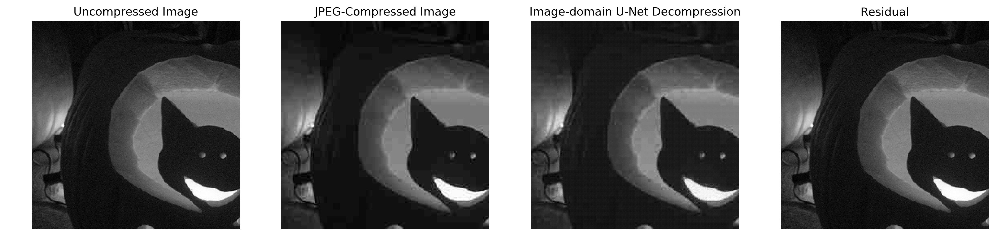

In [25]:
print(np.min(test_unc[slc,:,:,0]), np.max(test_unc[slc,:,:,0]))
print(np.min(test[slc,:,:,0]),np.max(test[slc,:,:,0]))

plt.figure(figsize = (18,12),dpi=300)
plt.subplot(1,4,1)
plt.axis("off")
plt.title("Uncompressed Image")
plt.imshow(test_unc[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,2)
plt.axis("off")
plt.title("JPEG-Compressed Image")
plt.imshow(test_compr[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,3)
plt.axis("off")
plt.title("Image-domain U-Net Decompression")
plt.imshow(test[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,4)
plt.axis("off")
plt.title("Residual")
plt.imshow(abs(test_unc[slc,:,:,0] - test[slc,:,:,0]),cmap = "gray")
plt.show()

0.0 255.0
0.5544586 257.63834


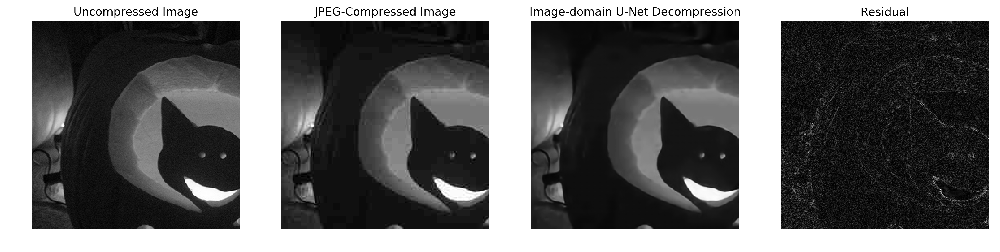

In [13]:
print(np.min(test_unc[slc,:,:,0]), np.max(test_unc[slc,:,:,0]))
print(np.min(pred[slc,:,:,0]),np.max(pred[slc,:,:,0]))

plt.figure(figsize = (18,12),dpi=300)
plt.subplot(1,4,1)
plt.axis("off")
plt.title("Uncompressed Image")
plt.imshow(test_unc[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,2)
plt.axis("off")
plt.title("JPEG-Compressed Image")
plt.imshow(test_compr[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,3)
plt.axis("off")
plt.title("Image-domain U-Net Decompression")
plt.imshow(pred[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,4)
plt.axis("off")
plt.title("Residual")
plt.imshow(abs(test_unc[slc,:,:,0] - pred[slc,:,:,0]),cmap = "gray")
plt.show()

In [14]:
print(np.sum((pred[slc,:,:,0] - test_unc[slc,:,:,0])**2) / pred[slc,:,:,0].size)

29.292314529418945


Test set results


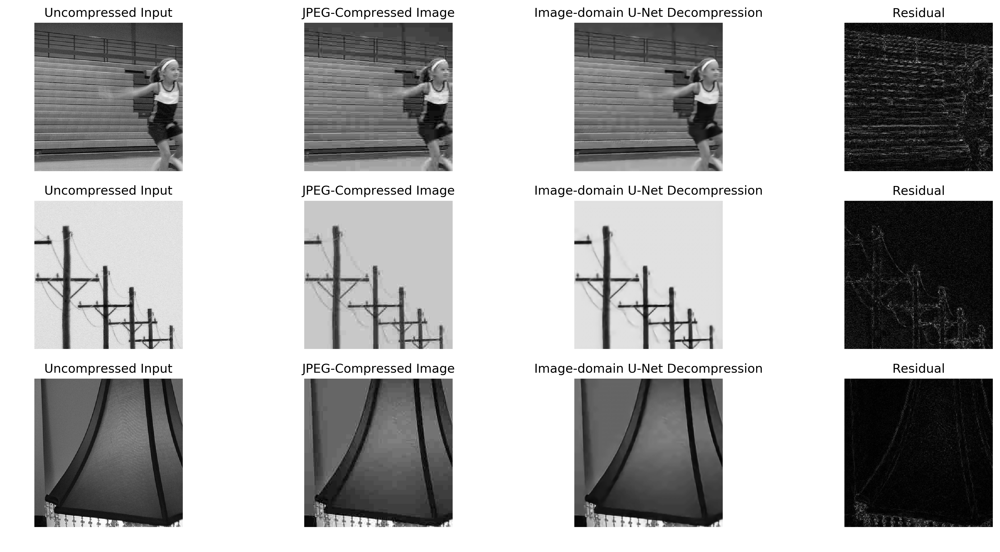

In [15]:
print("Test set results")
plt.figure(figsize = (18,9),dpi = 300)
for ii in range(3):
    plt.subplot(3,4,4*ii+1)
    plt.imshow(test_unc[indexes_test[ii],:,:,0],cmap = "gray")
    plt.axis("off")
    plt.title("Uncompressed Input")
    plt.subplot(3,4,4*ii+2)
    plt.imshow(test_compr[indexes_test[ii],:,:,0],cmap = "gray")
    plt.axis("off")
    plt.title("JPEG-Compressed Image")
    plt.subplot(3,4,4*ii+3)
    plt.imshow(pred[indexes_test[ii],:,:,0],cmap = "gray")
    plt.axis("off")
    plt.title("Image-domain U-Net Decompression")
    plt.subplot(3,4,4*ii+4)
    plt.imshow(abs(test_unc[indexes_test[ii],:,:,0]-pred[indexes_test[ii],:,:,0]),cmap = "gray")
    plt.axis("off")
    plt.title("Residual")
plt.show()     

In [16]:
metr = calculate_metrics(test_unc, pred)

(3624, 3, 2)


/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/skimage/util/arraycrop.py:177: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  cropped = ar[slices]
/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/skimage/measure/simple_metrics.py:92: RuntimeWarning: divide by zero encountered in double_scalars
  return np.sqrt(compare_mse(im_true, im_test)) / denom


removing 85 NRMSE from list.
removing 1727 NRMSE from list.
(3622, 3, 2)

Performance Metrics
SSIM: 0.824 +/- 0.098
PSNR: 28.723 +/- 3.863
NRMSE: 4.022 +/- 1.925


# ============================================================

# Network G: Fully-Connected Network

In [6]:
# DCT of validation set

test_compr_pat = extract_image_patches(norm_test_compr, patch_size = 8)

dct_test_compr = np.zeros(test_compr_pat.shape)

for ii in range(len(dct_test_compr)):
    dct_test_compr[ii,:,:,0] = py_dct2d(test_compr_pat[ii,:,:,0])

print(dct_test_compr.shape)

(3710976, 8, 8, 1)


In [7]:
opt=Adam(lr=0.001)
model_name = "../Models/20190606-imagenet-fc_f_data_augmentation_compress_10_20.hdf5"
model = dequantization_network()
model.compile(loss = "mse",optimizer=opt)

model.load_weights(model_name)

Instructions for updating:
Colocations handled automatically by placer.


In [8]:
dct_pred = model.predict(dct_test_compr)

# pred *= norm
# pred += norm

In [9]:
im_pred_pat = np.zeros(dct_pred.shape)

for ii in range(len(dct_pred)):
    im_pred_pat[ii,:,:,0] = py_idct2d(dct_pred[ii,:,:,0])

pred = compile_image_patches(im_pred_pat)

In [11]:
pred *= norm
pred += norm

0.0 255.0
37.832191467285156 355.2047424316406


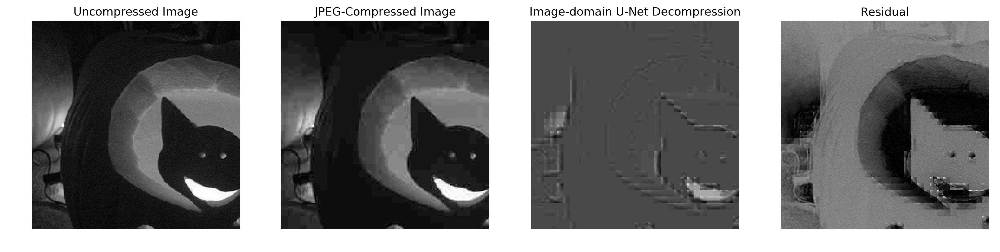

In [12]:
print(np.min(test_unc[slc,:,:,0]), np.max(test_unc[slc,:,:,0]))
print(np.min(pred[slc,:,:,0]),np.max(pred[slc,:,:,0]))

plt.figure(figsize = (18,12),dpi=300)
plt.subplot(1,4,1)
plt.axis("off")
plt.title("Uncompressed Image")
plt.imshow(test_unc[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,2)
plt.axis("off")
plt.title("JPEG-Compressed Image")
plt.imshow(test_compr[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,3)
plt.axis("off")
plt.title("Image-domain U-Net Decompression")
plt.imshow(pred[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,4)
plt.axis("off")
plt.title("Residual")
plt.imshow(abs(test_unc[slc,:,:,0] - pred[slc,:,:,0]),cmap = "gray")
plt.show()

Test set results


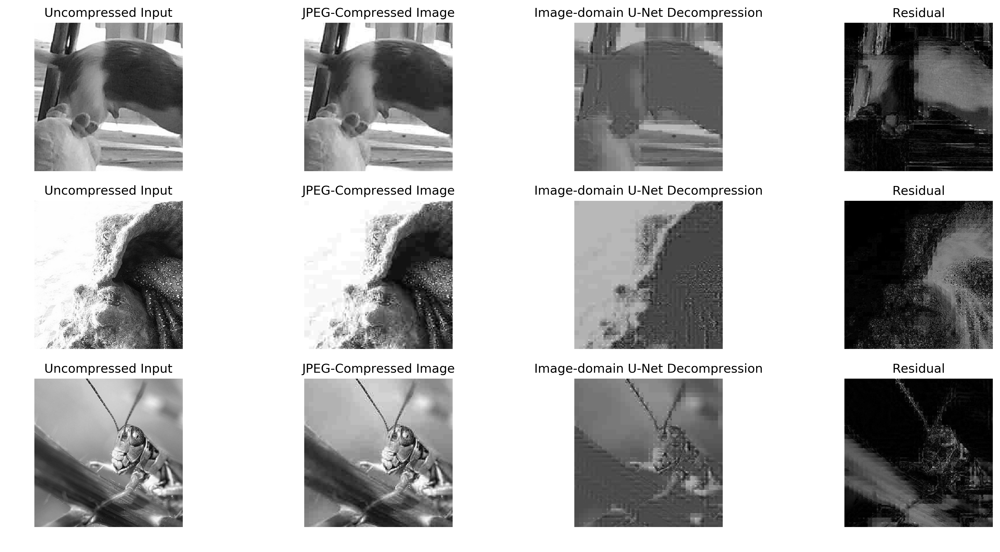

In [20]:
print("Test set results")
plt.figure(figsize = (18,9),dpi = 300)
for ii in range(3):
    plt.subplot(3,4,4*ii+1)
    plt.imshow(test_unc[indexes_test[ii],:,:,0],cmap = "gray")
    plt.axis("off")
    plt.title("Uncompressed Input")
    plt.subplot(3,4,4*ii+2)
    plt.imshow(test_compr[indexes_test[ii],:,:,0],cmap = "gray")
    plt.axis("off")
    plt.title("JPEG-Compressed Image")
    plt.subplot(3,4,4*ii+3)
    plt.imshow(pred[indexes_test[ii],:,:,0],cmap = "gray")
    plt.axis("off")
    plt.title("Image-domain U-Net Decompression")
    plt.subplot(3,4,4*ii+4)
    plt.imshow(abs(test_unc[indexes_test[ii],:,:,0]-pred[indexes_test[ii],:,:,0]),cmap = "gray")
    plt.axis("off")
    plt.title("Residual")
plt.show()     

In [21]:
metr = calculate_metrics(test_unc, pred)

(3624, 3, 2)


ValueError: Input images must have the same dtype.

# Network F: DFT-Image-domain W-net

In [11]:
opt=Adam(lr=0.001)
model_name = "../Models/20190611-imagenet-residual_wnet_patches_ki_data_augmentation_compress_10_20.hdf5"
model=deep_cascade_unet_rksp(depth_str='ki')
model.compile(loss = "mse",optimizer=opt)

model.load_weights(model_name)

0 k
Append rFFT layer
Append U-net (2-channel) block
Append iFFT layer
Append magnitude layer
Append data consistency layer (DCT-DC-iDCT)
1 i
Append U-net (single-channel) block
Append data consistency layer (DCT-DC-iDCT)


In [10]:
# Concatenate an imaginary channel of 0s
norm_test_compr = np.concatenate((norm_test_compr,np.zeros(norm_test_compr.shape)), axis=3)

In [19]:
pred = model.predict([norm_test_compr, test_qmat])

pred += norm

0.0 255.0
-0.7580261 266.4051


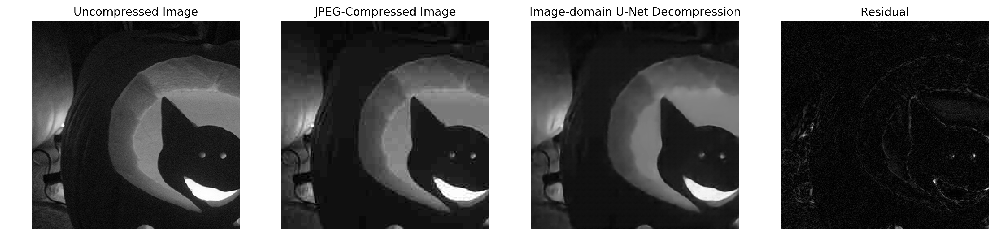

In [20]:
print(np.min(test_unc[slc,:,:,0]), np.max(test_unc[slc,:,:,0]))
print(np.min(pred[slc,:,:,0]),np.max(pred[slc,:,:,0]))

plt.figure(figsize = (18,12),dpi=300)
plt.subplot(1,4,1)
plt.axis("off")
plt.title("Uncompressed Image")
plt.imshow(test_unc[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,2)
plt.axis("off")
plt.title("JPEG-Compressed Image")
plt.imshow(test_compr[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,3)
plt.axis("off")
plt.title("Image-domain U-Net Decompression")
plt.imshow(pred[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,4)
plt.axis("off")
plt.title("Residual")
plt.imshow(abs(test_unc[slc,:,:,0] - pred[slc,:,:,0]),cmap = "gray")
plt.show()

In [21]:
print(np.sum((pred[slc,:,:,0] - test_unc[slc,:,:,0])**2) / pred[slc,:,:,0].size)

50.99436569213867


Test set results


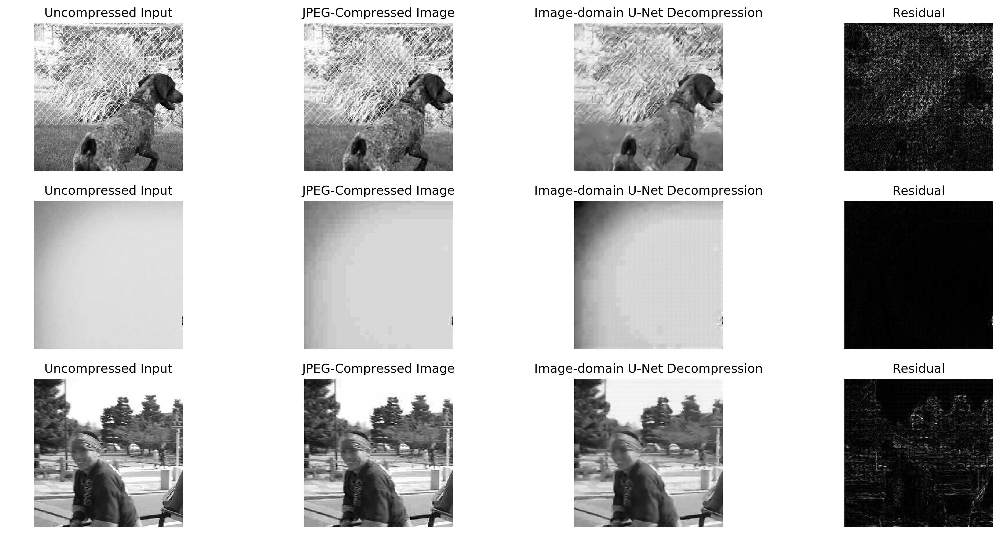

In [22]:
print("Test set results")
plt.figure(figsize = (18,9),dpi = 300)
for ii in range(3):
    plt.subplot(3,4,4*ii+1)
    plt.imshow(test_unc[indexes_test[ii],:,:,0],cmap = "gray")
    plt.axis("off")
    plt.title("Uncompressed Input")
    plt.subplot(3,4,4*ii+2)
    plt.imshow(test_compr[indexes_test[ii],:,:,0],cmap = "gray")
    plt.axis("off")
    plt.title("JPEG-Compressed Image")
    plt.subplot(3,4,4*ii+3)
    plt.imshow(pred[indexes_test[ii],:,:,0],cmap = "gray")
    plt.axis("off")
    plt.title("Image-domain U-Net Decompression")
    plt.subplot(3,4,4*ii+4)
    plt.imshow(abs(test_unc[indexes_test[ii],:,:,0]-pred[indexes_test[ii],:,:,0]),cmap = "gray")
    plt.axis("off")
    plt.title("Residual")
plt.show()     

In [23]:
metr = calculate_metrics(test_unc, pred)

(3624, 3, 2)


/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/skimage/util/arraycrop.py:177: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  cropped = ar[slices]
/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/skimage/measure/simple_metrics.py:92: RuntimeWarning: divide by zero encountered in double_scalars
  return np.sqrt(compare_mse(im_true, im_test)) / denom


removing 85 NRMSE from list.
removing 1727 NRMSE from list.
(3622, 3, 2)

Performance Metrics
SSIM: 0.733 +/- 0.130
PSNR: 25.621 +/- 3.687
NRMSE: 5.856 +/- 2.557


In [24]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 256, 256, 1)  0                                            
__________________________________________________________________________________________________
lambda_22 (Lambda)              (None, 256, 256, 2)  0           input_3[0][0]                    
__________________________________________________________________________________________________
conv2d_45 (Conv2D)              (None, 256, 256, 48) 912         lambda_22[0][0]                  
__________________________________________________________________________________________________
conv2d_46 (Conv2D)              (None, 256, 256, 48) 20784       conv2d_45[0][0]                  
__________________________________________________________________________________________________
conv2d_47 

In [30]:
layer1 = model.get_layer("add_10").output
intermed = Model(inputs=model.inputs, outputs=layer1)
test = intermed.predict([norm_test_compr, test_qmat])

# test *= norm
test += norm

0.0 255.0
-0.7580261 266.4051


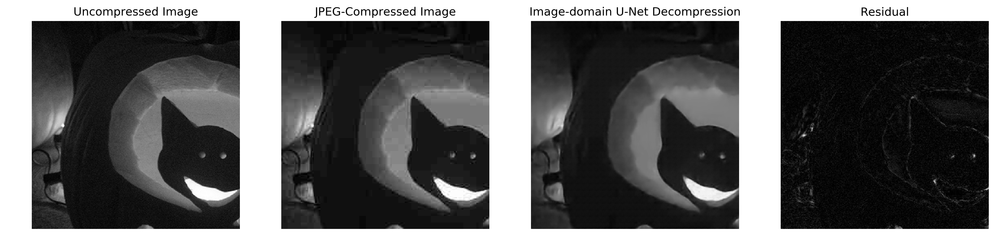

In [31]:
print(np.min(test_unc[slc,:,:,0]), np.max(test_unc[slc,:,:,0]))
print(np.min(test[slc,:,:,0]),np.max(test[slc,:,:,0]))

plt.figure(figsize = (18,12),dpi=300)
plt.subplot(1,4,1)
plt.axis("off")
plt.title("Uncompressed Image")
plt.imshow(test_unc[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,2)
plt.axis("off")
plt.title("JPEG-Compressed Image")
plt.imshow(test_compr[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,3)
plt.axis("off")
plt.title("Image-domain U-Net Decompression")
plt.imshow(test[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,4)
plt.axis("off")
plt.title("Residual")
plt.imshow(abs(test_unc[slc,:,:,0] - test[slc,:,:,0]),cmap = "gray")
plt.show()

In [32]:
afagwg = calculate_metrics(test, pred)

(3624, 3, 2)
removing 8 PSNR from list.


/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/skimage/util/arraycrop.py:177: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  cropped = ar[slices]
/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/skimage/measure/simple_metrics.py:142: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


removing 85 PSNR from list.
removing 200 PSNR from list.
removing 211 PSNR from list.
removing 369 PSNR from list.
removing 370 PSNR from list.
removing 506 PSNR from list.
removing 659 PSNR from list.
removing 1106 PSNR from list.
removing 1218 PSNR from list.
removing 1281 PSNR from list.
removing 1443 PSNR from list.
removing 1523 PSNR from list.
removing 1554 PSNR from list.
removing 1614 PSNR from list.
removing 1634 PSNR from list.
removing 1727 PSNR from list.
removing 1769 PSNR from list.
removing 1914 PSNR from list.
removing 1941 PSNR from list.
removing 1955 PSNR from list.
removing 1993 PSNR from list.
removing 2084 PSNR from list.
removing 2134 PSNR from list.
removing 2148 PSNR from list.
removing 2198 PSNR from list.
removing 2205 PSNR from list.
removing 2213 PSNR from list.
removing 2216 PSNR from list.
removing 2229 PSNR from list.
removing 2246 PSNR from list.
removing 2388 PSNR from list.
removing 2392 PSNR from list.
removing 2405 PSNR from list.
removing 2458 PSNR

# Network 1: Image-domain U-net

In [6]:
opt=Adam(lr=0.0001)
model_name = "../Models/single_qf/20190321-imagenet-residual_unet_i_data_augmentation_compress_5.hdf5"
model=deep_cascade_unet_no_dc(depth_str='i')
model.compile(loss = "mse",optimizer=opt)

model.load_weights(model_name)

Instructions for updating:
Colocations handled automatically by placer.
0 i
Append U-net block


In [7]:
pred = model.predict(norm_test_compr)

pred *= 128.0
pred += 128.0

0.0 254.0
6.08313 253.00087


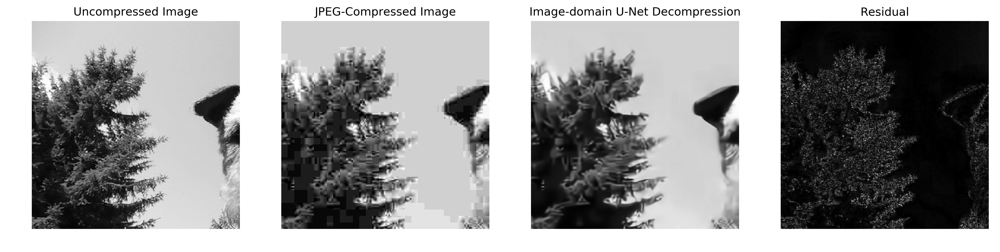

In [8]:
print(np.min(test_unc[slc,:,:,0]), np.max(test_unc[slc,:,:,0]))
print(np.min(pred[slc,:,:,0]),np.max(pred[slc,:,:,0]))

plt.figure(figsize = (18,12),dpi=300)
plt.subplot(1,4,1)
plt.axis("off")
plt.title("Uncompressed Image")
plt.imshow(test_unc[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,2)
plt.axis("off")
plt.title("JPEG-Compressed Image")
plt.imshow(test_compr[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,3)
plt.axis("off")
plt.title("Image-domain U-Net Decompression")
plt.imshow(pred[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,4)
plt.axis("off")
plt.title("Residual")
plt.imshow(abs(test_unc[slc,:,:,0] - pred[slc,:,:,0]),cmap = "gray")
plt.show()

Test set results


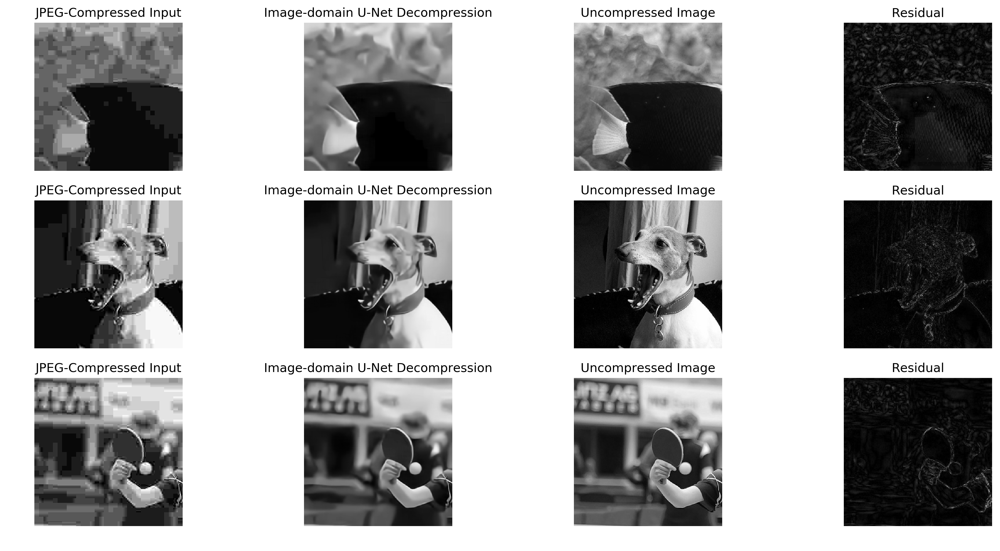

In [9]:
print("Test set results")
plt.figure(figsize = (18,9),dpi = 300)
for ii in range(3):
    plt.subplot(3,4,4*ii+1)
    plt.imshow(test_unc[indexes_test[ii],:,:,0],cmap = "gray")
    plt.axis("off")
    plt.title("Uncompressed Input")
    plt.subplot(3,4,4*ii+2)
    plt.imshow(test_compr[indexes_test[ii],:,:,0],cmap = "gray")
    plt.axis("off")
    plt.title("JPEG-Compressed Image")
    plt.subplot(3,4,4*ii+3)
    plt.imshow(pred[indexes_test[ii],:,:,0],cmap = "gray")
    plt.axis("off")
    plt.title("Image-domain U-Net Decompression")
    plt.subplot(3,4,4*ii+4)
    plt.imshow(abs(test_unc[indexes_test[ii],:,:,0]-pred[indexes_test[ii],:,:,0]),cmap = "gray")
    plt.axis("off")
    plt.title("Residual")
plt.show()     

In [10]:
metr = calculate_metrics(test_unc, pred)

(3624, 3, 2)


/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/skimage/util/arraycrop.py:177: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  cropped = ar[slices]


(3624, 3, 2)

Performance Metrics
SSIM: 0.727 +/- 0.129
PSNR: 25.983 +/- 3.414
NRMSE: 5.223 +/- 2.181


# Network 2: DCT-domain U-net

In [18]:
opt=Adam(lr=0.0001)
model_name = "../Models/single_qf/20190322-imagenet-residual_unet_d_data_augmentation_compress_5.hdf5"
model=deep_cascade_unet_no_dc(depth_str='i')
model.compile(loss = "mse",optimizer=opt)

model.load_weights(model_name)

0 i
Append U-net block


In [19]:
dct_pred = model.predict(dct_test_compr)

In [20]:
if useBlocks:
    for ii in range(len(test_images)):
        pred[ii,:,:,0] = idct_in_blocks(dct_pred[ii,:,:,0])
else:
    for ii in range(len(test_images)):
        pred[ii,:,:,0] = py_idct2d(dct_pred[ii,:,:,0])
        
pred *= 128.0
pred += 128.0

0.0 254.0
0.3499756 260.7744


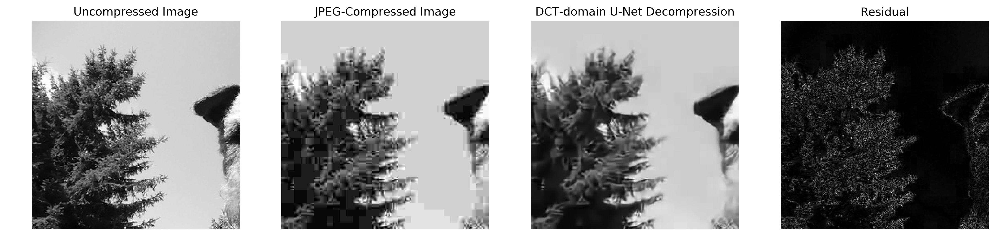

In [21]:
print(np.min(test_unc[slc,:,:,0]), np.max(test_unc[slc,:,:,0]))
print(np.min(pred[slc,:,:,0]),np.max(pred[slc,:,:,0]))

plt.figure(figsize = (18,12),dpi=300)
plt.subplot(1,4,1)
plt.axis("off")
plt.title("Uncompressed Image")
plt.imshow(test_unc[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,2)
plt.axis("off")
plt.title("JPEG-Compressed Image")
plt.imshow(test_compr[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,3)
plt.axis("off")
plt.title("DCT-domain U-Net Decompression")
plt.imshow(pred[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,4)
plt.axis("off")
plt.title("Residual")
plt.imshow(abs(test_unc[slc,:,:,0] - pred[slc,:,:,0]),cmap = "gray")
plt.show()

Test set results


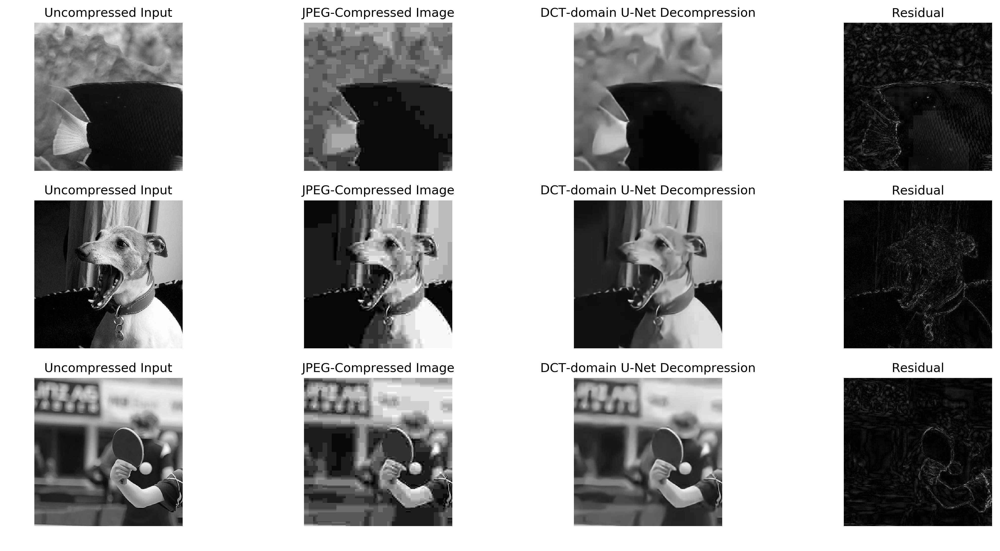

In [22]:
print("Test set results")
plt.figure(figsize = (18,9),dpi = 300)
for ii in range(3):
    plt.subplot(3,4,4*ii+1)
    plt.imshow(test_unc[indexes_test[ii],:,:,0],cmap = "gray")
    plt.axis("off")
    plt.title("Uncompressed Input")
    plt.subplot(3,4,4*ii+2)
    plt.imshow(test_compr[indexes_test[ii],:,:,0],cmap = "gray")
    plt.axis("off")
    plt.title("JPEG-Compressed Image")
    plt.subplot(3,4,4*ii+3)
    plt.imshow(pred[indexes_test[ii],:,:,0],cmap = "gray")
    plt.axis("off")
    plt.title("DCT-domain U-Net Decompression")
    plt.subplot(3,4,4*ii+4)
    plt.imshow(abs(test_unc[indexes_test[ii],:,:,0]-pred[indexes_test[ii],:,:,0]),cmap = "gray")
    plt.axis("off")
    plt.title("Residual")
plt.show()     

In [23]:
metr = calculate_metrics(test_unc, pred)

(3624, 3, 2)


/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/skimage/util/arraycrop.py:177: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  cropped = ar[slices]


(3624, 3, 2)

Performance Metrics
SSIM: 0.727 +/- 0.127
PSNR: 26.241 +/- 3.317
NRMSE: 5.326 +/- 2.195


# Network 3: DCT-Image-domain "Pseudo" W-net

In [41]:
# Load "pre-predicted" pseudo W-net input data
pred = np.load("../np_imagedata/single_qf/test_20190322-imagenet-residual_unet_d_data_augmentation_compress_5_2019-04-03-imagenet.npy")

print(np.min(pred), np.max(pred))
for ii in range(len(pred)):
    pred[ii,:,:,0] = (pred[ii,:,:,0] - np.min(pred[ii,:,:,0])) / (np.max(pred[ii,:,:,0]) - np.min(pred[ii,:,:,0])) 
    pred[ii,:,:,0] *= 2
    pred[ii,:,:,0] -= 1
print(np.min(pred), np.max(pred))

-45.546585 302.16565
-1.0 1.0


In [8]:
opt=Adam(lr=0.001)
model_name = "../Models/20190426-imagenet-residual_wnet_dc_di_data_augmentation_compress_10_20-2.hdf5"
model = deep_cascade_unet(depth_str='di')
model.compile(loss = "mse",optimizer=opt)

model.load_weights(model_name)

Instructions for updating:
Colocations handled automatically by placer.
0 d
Instructions for updating:
Use tf.cast instead.
Append DCT layer
Append U-net block
Append iDCT layer
1 i
Append U-net block


In [13]:
# pred -= 128.0
# pred /= 128.0

pred = model.predict([norm_test_compr,test_qmat]) # For the pseudo W-net, use output from network 2 as input to model

# pred *= 128.0
pred += 128.0

0.0 255.0
2.3091888 260.30365


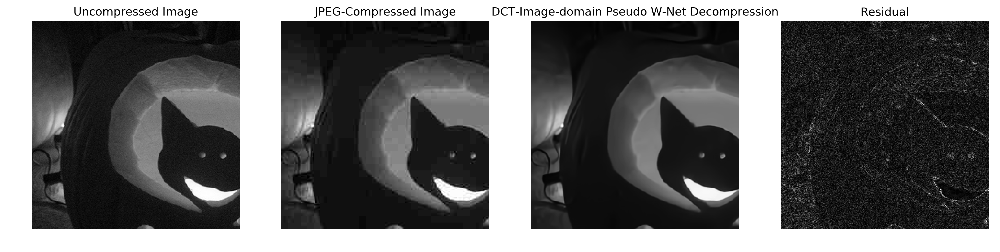

In [14]:
print(np.min(test_unc[slc,:,:,0]), np.max(test_unc[slc,:,:,0]))
print(np.min(pred[slc,:,:,0]),np.max(pred[slc,:,:,0]))

plt.figure(figsize = (18,12),dpi=300)
plt.subplot(1,4,1)
plt.axis("off")
plt.title("Uncompressed Image")
plt.imshow(test_unc[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,2)
plt.axis("off")
plt.title("JPEG-Compressed Image")
plt.imshow(test_compr[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,3)
plt.axis("off")
plt.title("DCT-Image-domain Pseudo W-Net Decompression")
plt.imshow(pred[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,4)
plt.axis("off")
plt.title("Residual")
plt.imshow(abs(test_unc[slc,:,:,0] - pred[slc,:,:,0]),cmap = "gray")
plt.show()

Test set results


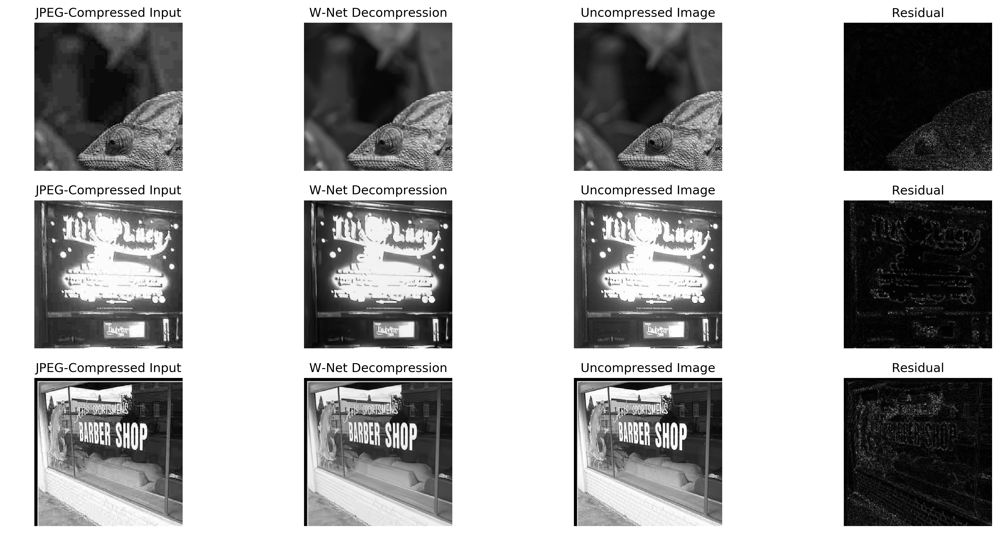

In [15]:
print("Test set results")
plt.figure(figsize = (18,9),dpi = 300)
for ii in range(3):
    plt.subplot(3,4,4*ii+1)
    plt.imshow(test_compr[indexes_test[ii],:,:,0],cmap = "gray")
    plt.axis("off")
    plt.title("JPEG-Compressed Input")
    plt.subplot(3,4,4*ii+2)
    plt.imshow(pred[indexes_test[ii],:,:,0],cmap = "gray")
    plt.axis("off")
    plt.title("W-Net Decompression")
    plt.subplot(3,4,4*ii+3)
    plt.imshow(test_unc[indexes_test[ii],:,:,0],cmap = "gray")
    plt.axis("off")
    plt.title("Uncompressed Image")
    plt.subplot(3,4,4*ii+4)
    plt.imshow(abs(test_unc[indexes_test[ii],:,:,0]-pred[indexes_test[ii],:,:,0]),cmap = "gray")
    plt.axis("off")
    plt.title("Residual")
plt.show()     

In [16]:
metr = calculate_metrics(test_unc, pred)

(3624, 3, 2)


/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/skimage/util/arraycrop.py:177: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  cropped = ar[slices]
/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/skimage/measure/simple_metrics.py:92: RuntimeWarning: divide by zero encountered in double_scalars
  return np.sqrt(compare_mse(im_true, im_test)) / denom


removing 85 NRMSE from list.
removing 1727 NRMSE from list.
(3622, 3, 2)

Performance Metrics
SSIM: 0.841 +/- 0.097
PSNR: 29.471 +/- 4.128
NRMSE: 3.662 +/- 1.786


# Network 4: Image-Image-domain W-net

In [16]:
opt=Adam(lr=0.001)
model_name = "../Models/single_qf/20190321-imagenet-residual_wnet_ii_data_augmentation_compress_5.hdf5"
model=deep_cascade_unet_no_dc(depth_str='ii')
model.compile(loss = "mse",optimizer=opt)

model.load_weights(model_name)

0 i
Append U-net block
1 i
Append U-net block


In [17]:
pred = model.predict(norm_test_compr)

pred *= 128.0
pred += 128.0

0.0 254.0
6.462982 254.6813


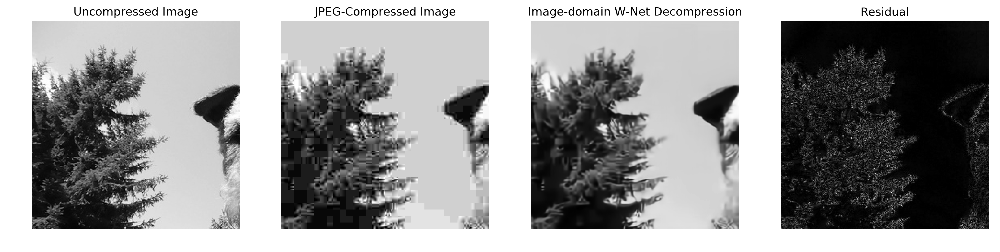

In [18]:
print(np.min(test_unc[slc,:,:,0]), np.max(test_unc[slc,:,:,0]))
print(np.min(pred[slc,:,:,0]),np.max(pred[slc,:,:,0]))

plt.figure(figsize = (18,12),dpi=300)
plt.subplot(1,4,1)
plt.axis("off")
plt.title("Uncompressed Image")
plt.imshow(test_unc[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,2)
plt.axis("off")
plt.title("JPEG-Compressed Image")
plt.imshow(test_compr[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,3)
plt.axis("off")
plt.title("Image-domain W-Net Decompression")
plt.imshow(pred[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,4)
plt.axis("off")
plt.title("Residual")
plt.imshow(abs(test_unc[slc,:,:,0] - pred[slc,:,:,0]),cmap = "gray")
plt.show()

Test set results


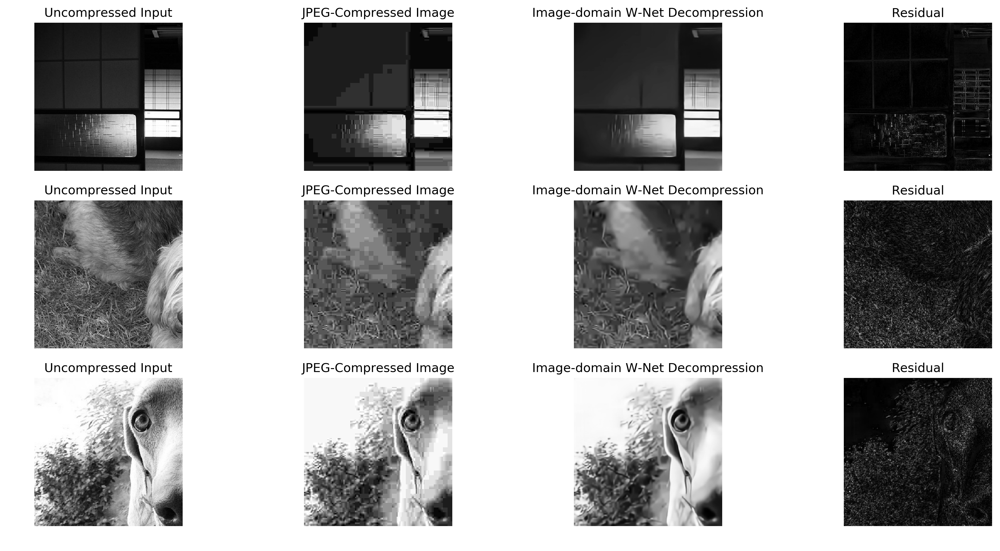

In [19]:
print("Test set results")
plt.figure(figsize = (18,9),dpi = 300)
for ii in range(3):
    plt.subplot(3,4,4*ii+1)
    plt.imshow(test_unc[indexes_test[ii],:,:,0],cmap = "gray")
    plt.axis("off")
    plt.title("Uncompressed Input")
    plt.subplot(3,4,4*ii+2)
    plt.imshow(test_compr[indexes_test[ii],:,:,0],cmap = "gray")
    plt.axis("off")
    plt.title("JPEG-Compressed Image")
    plt.subplot(3,4,4*ii+3)
    plt.imshow(pred[indexes_test[ii],:,:,0],cmap = "gray")
    plt.axis("off")
    plt.title("Image-domain W-Net Decompression")
    plt.subplot(3,4,4*ii+4)
    plt.imshow(abs(test_unc[indexes_test[ii],:,:,0]-pred[indexes_test[ii],:,:,0]),cmap = "gray")
    plt.axis("off")
    plt.title("Residual")
plt.show()     

In [20]:
metr = calculate_metrics(test_unc, pred)

(3624, 3, 2)


/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/skimage/util/arraycrop.py:177: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  cropped = ar[slices]


(3624, 3, 2)

Performance Metrics
SSIM: 0.731 +/- 0.129
PSNR: 26.072 +/- 3.472
NRMSE: 5.152 +/- 2.148


# Network 5: DCT-DCT-domain W-net

In [14]:
#pred = np.zeros((len(test_images),256,256,1), dtype=np.float32)
pred = pred.astype(np.float32)

In [6]:
opt=Adam(lr=0.001)
model_name = "../Models/single_qf/20190404-imagenet-residual_wnet_dd_data_augmentation_compress_5.hdf5"
model=deep_cascade_unet_no_dc(depth_str='ii') # doing DCT outside of network so use 'ii'
model.compile(loss = "mse",optimizer=opt)

model.load_weights(model_name)

Instructions for updating:
Colocations handled automatically by placer.
0 i
Append U-net block
1 i
Append U-net block


In [7]:
dct_pred = model.predict(dct_test_compr)

In [10]:
if useBlocks:
    for ii in range(len(test_images)):
        pred[ii,:,:,0] = idct_in_blocks(dct_pred[ii,:,:,0])
else:
    for ii in range(len(test_images)):
        pred[ii,:,:,0] = py_idct2d(dct_pred[ii,:,:,0])
        
pred *= 128.0
pred += 128.0

0.0 254.0
3.975006103515625 258.538330078125


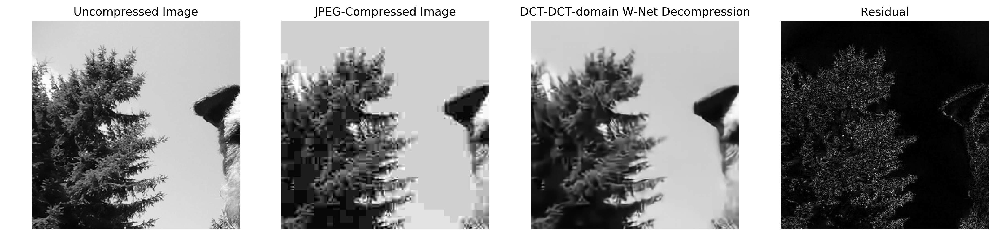

In [11]:
print(np.min(test_unc[slc,:,:,0]), np.max(test_unc[slc,:,:,0]))
print(np.min(pred[slc,:,:,0]),np.max(pred[slc,:,:,0]))

plt.figure(figsize = (18,12),dpi=300)
plt.subplot(1,4,1)
plt.axis("off")
plt.title("Uncompressed Image")
plt.imshow(test_unc[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,2)
plt.axis("off")
plt.title("JPEG-Compressed Image")
plt.imshow(test_compr[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,3)
plt.axis("off")
plt.title("DCT-DCT-domain W-Net Decompression")
plt.imshow(pred[slc,:,:,0],cmap = "gray")
plt.subplot(1,4,4)
plt.axis("off")
plt.title("Residual")
plt.imshow(abs(test_unc[slc,:,:,0] - pred[slc,:,:,0]),cmap = "gray")
plt.show()

Test set results


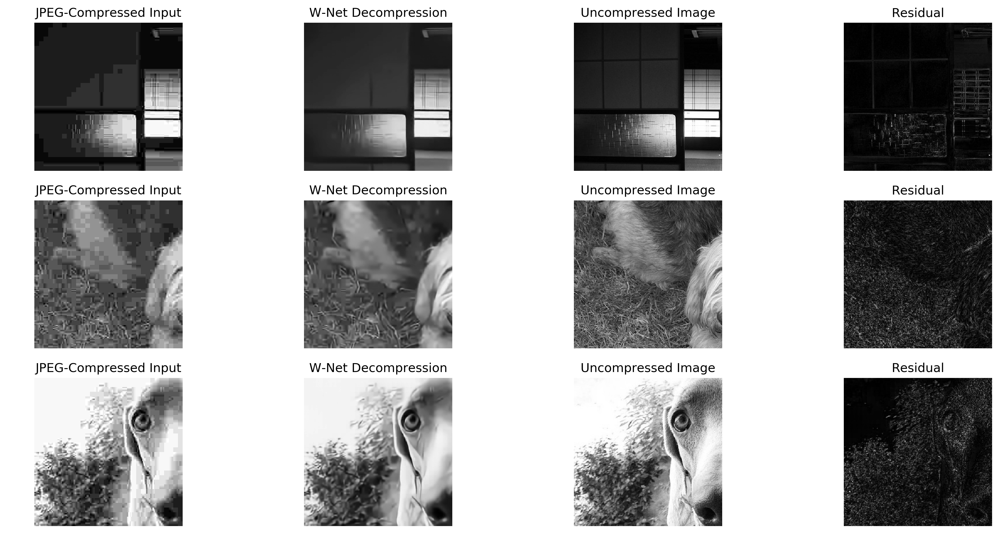

In [12]:
print("Test set results")
plt.figure(figsize = (18,9),dpi = 300)
for ii in range(3):
    plt.subplot(3,4,4*ii+1)
    plt.imshow(test_compr[indexes_test[ii],:,:,0],cmap = "gray")
    plt.axis("off")
    plt.title("JPEG-Compressed Input")
    plt.subplot(3,4,4*ii+2)
    plt.imshow(pred[indexes_test[ii],:,:,0],cmap = "gray")
    plt.axis("off")
    plt.title("W-Net Decompression")
    plt.subplot(3,4,4*ii+3)
    plt.imshow(test_unc[indexes_test[ii],:,:,0],cmap = "gray")
    plt.axis("off")
    plt.title("Uncompressed Image")
    plt.subplot(3,4,4*ii+4)
    plt.imshow(abs(test_unc[indexes_test[ii],:,:,0]-pred[indexes_test[ii],:,:,0]),cmap = "gray")
    plt.axis("off")
    plt.title("Residual")
plt.show()     

In [15]:
metr = calculate_metrics(test_unc, pred)

(3624, 3, 2)


/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/skimage/util/arraycrop.py:177: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  cropped = ar[slices]


(3624, 3, 2)

Performance Metrics
SSIM: 0.735 +/- 0.128
PSNR: 26.410 +/- 3.420
NRMSE: 5.200 +/- 2.163


In [33]:
# force stop "run all"
paoksdf += awew

NameError: name 'paoksdf' is not defined

In [ ]:
np.save("../np_imagedata/test_unc.npy",test_unc)
np.save("../np_imagedata/test_compr.npy",test_compr)


In [ ]:
! mkdir ../np_imagedata/20190328_test_results/qf10-20
np.save("../np_imagedata/20190328_test_results/qf10-20/net5_pred",pred)

In [ ]:
from scipy.io import savemat
from scipy.misc import imsave

im1 = Image.open(test_images[244])
im1_array = np.array(im1,dtype=np.float32)

buffer = io.BytesIO()
im1.save(buffer, "JPEG", quality=12)
im2 = Image.open(buffer)
im2_array = np.array(im2,dtype=np.float32)

im1_array -= 128.0
im1_array /= 128.0

im2_array -= 128.0
im2_array /= 128.0

dct1=dct_in_blocks(im1_array)
dct2=dct_in_blocks(im2_array)

# Display the images
plt.figure(figsize=(18,9))
plt.subplot(2,3,1)
plt.imshow(im1_array, cmap="gray")
plt.axis("off")
plt.title("Uncompressed")
plt.subplot(2,3,2)
plt.imshow(im2_array, cmap="gray")
plt.axis("off")
plt.title("JPEG compressed")
plt.subplot(2,3,3)
plt.imshow(abs(im1_array - im2_array), cmap="gray")
plt.axis("off")
plt.title("Residual")
plt.subplot(2,3,4)
plt.imshow(dct1, cmap="gray", vmin=0, vmax=1/128.0)
plt.axis("off")
plt.subplot(2,3,5)
plt.imshow(dct2, cmap="gray", vmin=0, vmax=1/128.0)
plt.axis("off")
plt.subplot(2,3,6)
plt.imshow(abs(dct1 - dct2), cmap="gray", vmin=0, vmax=1/128.0)
plt.axis("off")
plt.show()

In [ ]:
opt=Adam(lr=0.0001)

model_name = "../Models/20190325-pretrained-residual_pseudo_wnet_di_data_augmentation_compress_10_20-float.hdf5"
model=deep_cascade_unet_no_dc(depth_str='i')


# model_name = "../Models/20190325-pretrained-residual_unet_d_data_augmentation_compress_10_20.hdf5"
# model=my_unet()





model.compile(loss = "mse",optimizer=opt)

model.load_weights(model_name)

In [ ]:
tens = np.zeros((1,256,256,1))
tens[0,:,:,0] = img_pred
#tens[0,:,:,0] = dct2

In [ ]:
tens_dct_pred = model.predict(tens)

# dct_pred = tens_dct_pred[0,:,:,0]
# img_pred = idct_in_blocks(dct_pred)

In [ ]:
plt.figure(figsize=(18,9),dpi=300)
plt.subplot(2,4,1)
plt.imshow(im1_array, cmap="gray")
plt.axis("off")
plt.title("Uncompressed Image")
plt.subplot(2,4,2)
plt.imshow(im2_array, cmap="gray")
plt.axis("off")
plt.title("JPEG-Compressed Image")
plt.subplot(2,4,3)
plt.imshow(img_pred, cmap="gray")
plt.axis("off")
plt.title("DCT U-net Prediction")
plt.subplot(2,4,4)
plt.imshow(abs(im1_array-img_pred), cmap="gray")
plt.axis("off")
plt.title("DCT Residual")
plt.subplot(2,4,5)
plt.imshow(dct1, cmap="gray",vmin=0,vmax=1/128.0)
plt.axis("off")
plt.title("Unquantized DCT Coefficients")
plt.subplot(2,4,6)
plt.imshow(dct2, cmap="gray",vmin=0,vmax=1/128.0)
plt.axis("off")
plt.title("Quantized DCT Coefficients")
plt.subplot(2,4,7)
plt.imshow(dct_pred, cmap="gray",vmin=0,vmax=1/128.0)
plt.axis("off")
plt.title("DCT U-net Prediction")
plt.subplot(2,4,8)
plt.imshow(abs(dct1-dct_pred), cmap="gray",vmin=0,vmax=1/128.0)
plt.axis("off")
plt.title("DCT Residual")
plt.show()

In [ ]:
test_unc = np.zeros((1,256,256,1))
test_compr = test_unc.copy()
tens_pred = test_unc.copy();

test_unc[0,:,:,0] = im1_array
test_compr[0,:,:,0] = im2_array
tens_pred[0,:,:,0] = img_pred

metrics = calculate_metrics(test_unc, test_compr, tens_pred)